# Fruit Computer Vision Mini Project

This notebook uses the images in `datasets/` and is executed with the Conda environment `myenv`.

**Note:** Part C.9 mentions `j.png`, but the provided dataset contains `morphology.png`. I use `morphology.png` as the intended morphology demo image.

In [1]:
from pathlib import Path
import math
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['axes.grid'] = False

DATASET_DIR = Path('datasets')
OUTPUT_DIR = Path('outputs')
OUTPUT_DIR.mkdir(exist_ok=True)

def load_bgr(name):
    path = DATASET_DIR / name
    image = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(path)
    return image

def bgr_to_rgb(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def show_images(items, cmap=None, figsize=(18, 5), suptitle=None):
    fig, axes = plt.subplots(1, len(items), figsize=figsize)
    if len(items) == 1:
        axes = [axes]
    for ax, (title, image, image_cmap) in zip(axes, items):
        ax.imshow(image, cmap=image_cmap if image_cmap is not None else cmap)
        ax.set_title(title)
        ax.axis('off')
    if suptitle:
        fig.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

def safe_imwrite(path, image):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    ok = cv2.imwrite(str(path), image)
    if not ok:
        raise IOError(f'Could not write image to {path}')
    return path

def apply_hsv_mask(bgr, lower, upper):
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    return cv2.inRange(hsv, np.array(lower, dtype=np.uint8), np.array(upper, dtype=np.uint8))

def largest_component(mask):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    if num_labels <= 1:
        return mask.copy()
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    return np.where(labels == largest_idx, 255, 0).astype(np.uint8)

print('Dataset files:')
for path in sorted(DATASET_DIR.iterdir()):
    print('-', path.name)

Dataset files:
- banana.jpg
- cherry.jpg
- chessboard.png
- green_apple.jpg
- lime.jpg
- mixed_bowl.png
- morphology.png
- orange.jpg
- red_apple.jpg
- strawberry.jpg


## Part A — Color Space & Fruit Segmentation

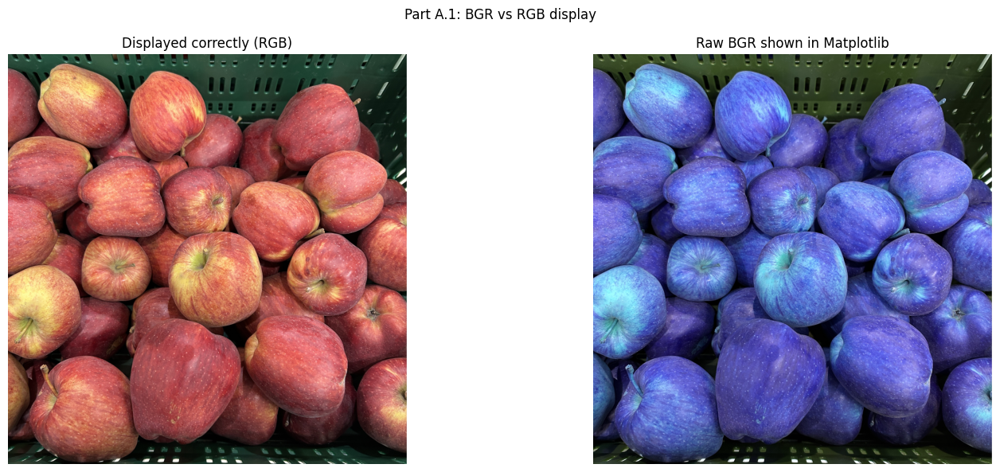

In [2]:
red_apple_bgr = load_bgr('red_apple.jpg')
red_apple_rgb = bgr_to_rgb(red_apple_bgr)

show_images([
    ('Displayed correctly (RGB)', red_apple_rgb, None),
    ('Raw BGR shown in Matplotlib', red_apple_bgr, None),
], figsize=(16, 6), suptitle='Part A.1: BGR vs RGB display')

**Observation:** Matplotlib expects RGB ordering, so the raw BGR image shows swapped colors. The red apple appears bluish/cyan in the raw display because the blue and red channels are reversed.

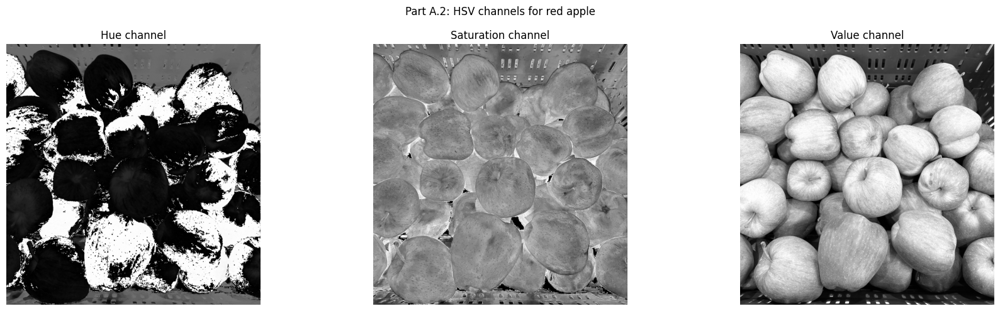

In [3]:
red_apple_hsv = cv2.cvtColor(red_apple_bgr, cv2.COLOR_BGR2HSV)
h_channel, s_channel, v_channel = cv2.split(red_apple_hsv)
show_images([
    ('Hue channel', h_channel, 'gray'),
    ('Saturation channel', s_channel, 'gray'),
    ('Value channel', v_channel, 'gray'),
], figsize=(18, 5), suptitle='Part A.2: HSV channels for red apple')

**Observation:** The **Saturation (S)** channel separates the fruit from the white background best. The background is nearly white and therefore low-saturation, while the fruit stays strongly saturated.

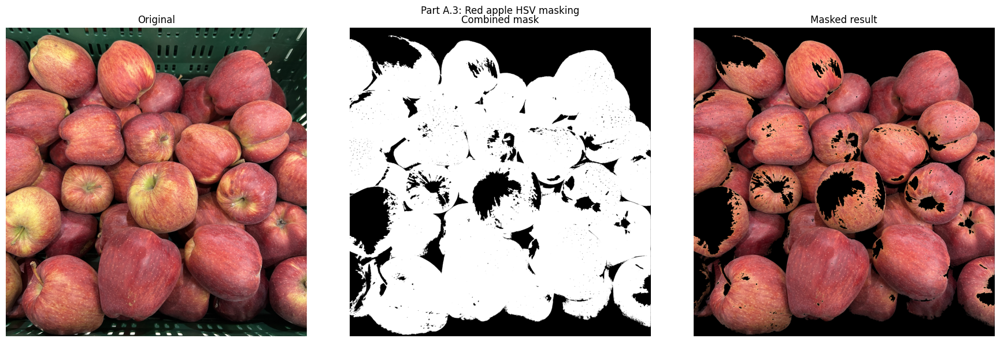

In [4]:
red_mask_1 = apply_hsv_mask(red_apple_bgr, (0, 80, 40), (10, 255, 255))
red_mask_2 = apply_hsv_mask(red_apple_bgr, (170, 80, 40), (180, 255, 255))
red_mask = cv2.bitwise_or(red_mask_1, red_mask_2)
red_mask_clean = largest_component(red_mask)
red_result = cv2.bitwise_and(red_apple_bgr, red_apple_bgr, mask=red_mask_clean)
show_images([
    ('Original', red_apple_rgb, None),
    ('Combined mask', red_mask_clean, 'gray'),
    ('Masked result', bgr_to_rgb(red_result), None),
], figsize=(18, 6), suptitle='Part A.3: Red apple HSV masking')

In [5]:
fruit_ranges = {
    'red_apple': [((0, 80, 40), (10, 255, 255)), ((170, 80, 40), (180, 255, 255))],
    'green_apple': [((35, 35, 30), (95, 255, 255))],
    'banana': [((10, 50, 60), (40, 255, 255))],
    'lime': [((35, 40, 30), (95, 255, 255))],
}

fruit_files = {
    'red_apple': 'red_apple.jpg',
    'green_apple': 'green_apple.jpg',
    'banana': 'banana.jpg',
    'lime': 'lime.jpg',
}

rows = []
for fruit, ranges in fruit_ranges.items():
    lowers = np.array([r[0] for r in ranges])
    uppers = np.array([r[1] for r in ranges])
    rows.append({
        'Fruit': fruit,
        'H_min': int(lowers[:, 0].min()),
        'H_max': int(uppers[:, 0].max()),
        'S_min': int(lowers[:, 1].min()),
        'S_max': int(uppers[:, 1].max()),
        'V_min': int(lowers[:, 2].min()),
        'V_max': int(uppers[:, 2].max()),
    })

display(pd.DataFrame(rows))

,Fruit,H_min,H_max,S_min,S_max,V_min,V_max
0,red_apple,0,180,80,255,40,255
1,green_apple,35,95,35,255,30,255
2,banana,10,40,50,255,60,255
3,lime,35,95,40,255,30,255


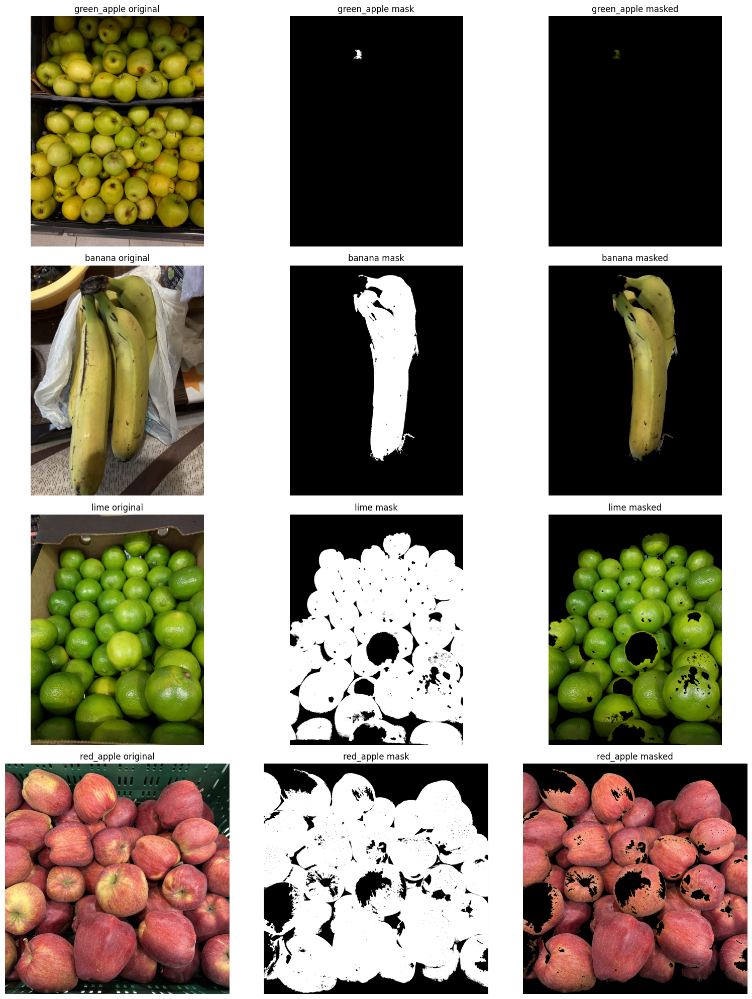

In [6]:
fig, axes = plt.subplots(4, 3, figsize=(16, 20))
for row_idx, fruit in enumerate(['green_apple', 'banana', 'lime', 'red_apple']):
    bgr = load_bgr(fruit_files[fruit])
    mask = np.zeros(bgr.shape[:2], dtype=np.uint8)
    for lower, upper in fruit_ranges[fruit]:
        mask = cv2.bitwise_or(mask, apply_hsv_mask(bgr, lower, upper))
    mask = largest_component(mask)
    masked = cv2.bitwise_and(bgr, bgr, mask=mask)
    axes[row_idx, 0].imshow(bgr_to_rgb(bgr))
    axes[row_idx, 0].set_title(f'{fruit} original')
    axes[row_idx, 1].imshow(mask, cmap='gray')
    axes[row_idx, 1].set_title(f'{fruit} mask')
    axes[row_idx, 2].imshow(bgr_to_rgb(masked))
    axes[row_idx, 2].set_title(f'{fruit} masked')
    for col_idx in range(3):
        axes[row_idx, col_idx].axis('off')
plt.tight_layout()
plt.show()

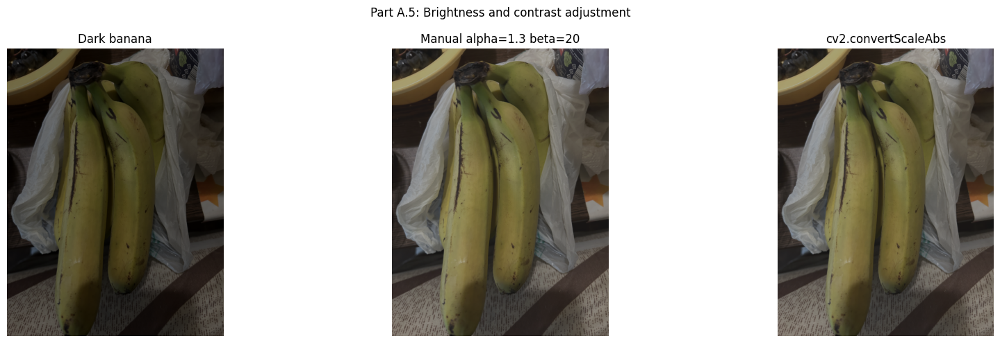

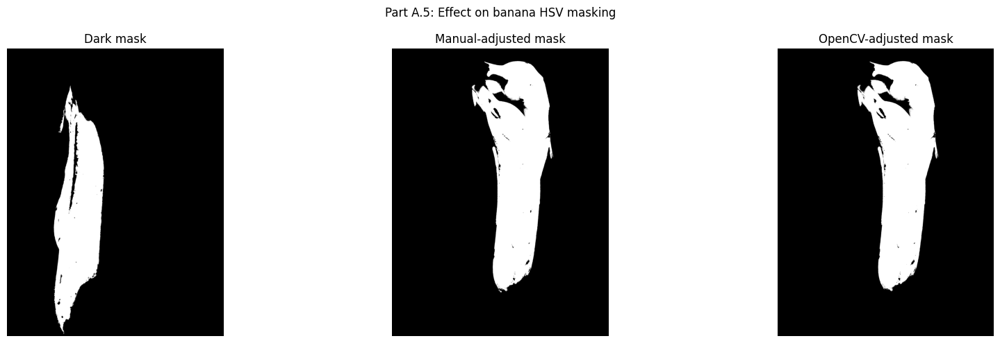

Mask foreground pixel counts:
{'original': 2147782, 'dark': 1398848, 'manual_adjusted': 2044750, 'opencv_adjusted': 2043427}


In [7]:
banana_bgr = load_bgr('banana.jpg')
dark_banana = np.clip(banana_bgr.astype(np.float32) * 0.45, 0, 255).astype(np.uint8)
manual_bc = np.clip(1.3 * dark_banana.astype(np.float32) + 20, 0, 255).astype(np.uint8)
opencv_bc = cv2.convertScaleAbs(dark_banana, alpha=1.3, beta=20)

banana_mask_original = largest_component(apply_hsv_mask(banana_bgr, (10, 50, 60), (40, 255, 255)))
banana_mask_dark = largest_component(apply_hsv_mask(dark_banana, (10, 50, 60), (40, 255, 255)))
banana_mask_manual = largest_component(apply_hsv_mask(manual_bc, (10, 50, 60), (40, 255, 255)))
banana_mask_cv = largest_component(apply_hsv_mask(opencv_bc, (10, 50, 60), (40, 255, 255)))

show_images([
    ('Dark banana', bgr_to_rgb(dark_banana), None),
    ('Manual alpha=1.3 beta=20', bgr_to_rgb(manual_bc), None),
    ('cv2.convertScaleAbs', bgr_to_rgb(opencv_bc), None),
], figsize=(18, 5), suptitle='Part A.5: Brightness and contrast adjustment')

show_images([
    ('Dark mask', banana_mask_dark, 'gray'),
    ('Manual-adjusted mask', banana_mask_manual, 'gray'),
    ('OpenCV-adjusted mask', banana_mask_cv, 'gray'),
], figsize=(18, 5), suptitle='Part A.5: Effect on banana HSV masking')

print('Mask foreground pixel counts:')
print({
    'original': int(np.count_nonzero(banana_mask_original)),
    'dark': int(np.count_nonzero(banana_mask_dark)),
    'manual_adjusted': int(np.count_nonzero(banana_mask_manual)),
    'opencv_adjusted': int(np.count_nonzero(banana_mask_cv)),
})

### Part A.6 Reflection

HSV works better than RGB for fruit segmentation because it separates **color identity** (Hue) from **colorfulness** (Saturation) and **brightness** (Value). That makes it easier to keep the fruit color while ignoring a bright white background or mild lighting variation.

It can fail when the fruit is very dark, desaturated, strongly shadowed, reflective, or close in color to the background. Dark purple grapes or blueberries are a good example: their hue may be unstable, their saturation can drop in shadows, and their low value makes them blend into dark regions.

## Part B — Histograms & Filtering

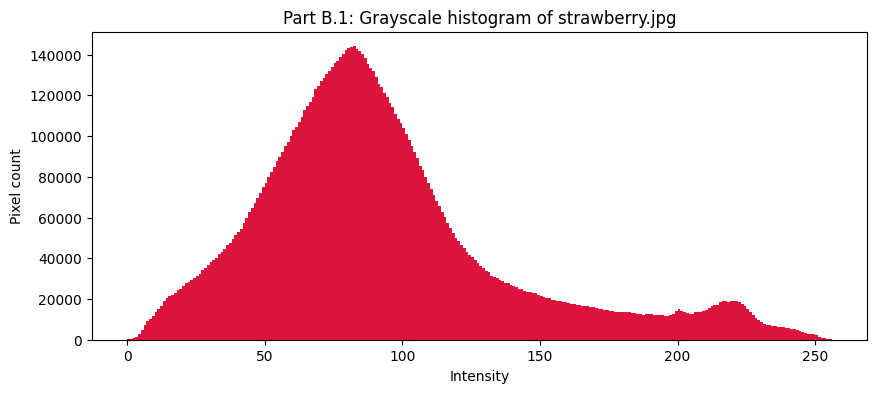

Mean intensity: 92.62
Std intensity: 46.91


In [8]:
strawberry_gray = cv2.imread(str(DATASET_DIR / 'strawberry.jpg'), cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10, 4))
plt.hist(strawberry_gray.ravel(), bins=256, range=(0, 256), color='crimson')
plt.title('Part B.1: Grayscale histogram of strawberry.jpg')
plt.xlabel('Intensity')
plt.ylabel('Pixel count')
plt.show()
print('Mean intensity:', round(float(strawberry_gray.mean()), 2))
print('Std intensity:', round(float(strawberry_gray.std()), 2))

**Observation:** The histogram is concentrated toward brighter intensities because the background is bright. The spread still covers darker fruit pixels, so the image is not severely underexposed, but the contrast is uneven because much of the frame belongs to the light backdrop.

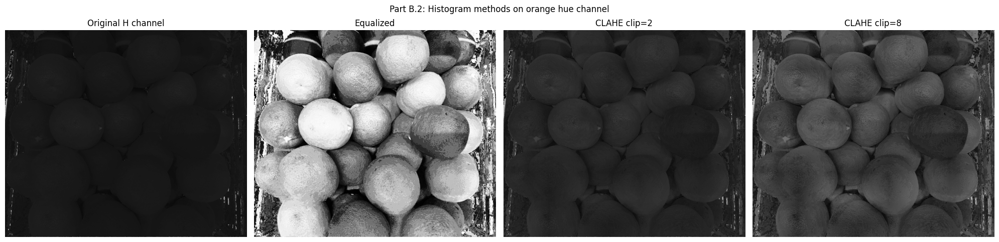

In [9]:
orange_bgr = load_bgr('orange.jpg')
orange_hsv = cv2.cvtColor(orange_bgr, cv2.COLOR_BGR2HSV)
orange_h = orange_hsv[:, :, 0]
orange_eq = cv2.equalizeHist(orange_h)
clahe_2 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(orange_h)
clahe_8 = cv2.createCLAHE(clipLimit=8.0, tileGridSize=(8, 8)).apply(orange_h)

show_images([
    ('Original H channel', orange_h, 'gray'),
    ('Equalized', orange_eq, 'gray'),
    ('CLAHE clip=2', clahe_2, 'gray'),
    ('CLAHE clip=8', clahe_8, 'gray'),
], figsize=(20, 5), suptitle='Part B.2: Histogram methods on orange hue channel')

**Observation:** CLAHE with `clipLimit=2.0` usually gives the best balance. Global equalization can over-amplify the background, and a very high CLAHE limit can exaggerate texture/noise.

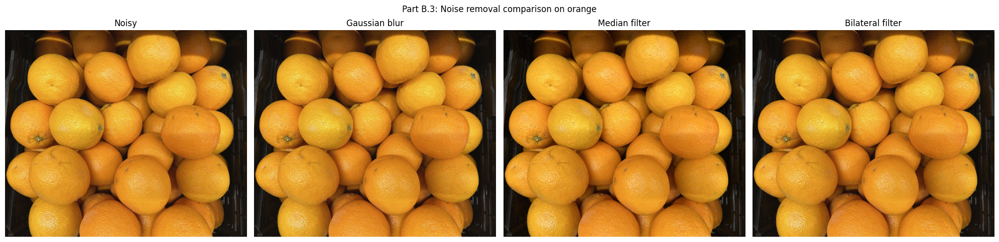

In [10]:
rng = np.random.default_rng(7)
orange_noisy = np.clip(orange_bgr.astype(np.float32) + rng.normal(0, 25, orange_bgr.shape), 0, 255).astype(np.uint8)
orange_gaussian = cv2.GaussianBlur(orange_noisy, (5, 5), 0)
orange_median = cv2.medianBlur(orange_noisy, 5)
orange_bilateral = cv2.bilateralFilter(orange_noisy, d=9, sigmaColor=60, sigmaSpace=60)
show_images([
    ('Noisy', bgr_to_rgb(orange_noisy), None),
    ('Gaussian blur', bgr_to_rgb(orange_gaussian), None),
    ('Median filter', bgr_to_rgb(orange_median), None),
    ('Bilateral filter', bgr_to_rgb(orange_bilateral), None),
], figsize=(20, 5), suptitle='Part B.3: Noise removal comparison on orange')

**Observation:** The bilateral filter keeps the fruit boundary sharp best while still suppressing noise. Gaussian blur smooths noise but softens edges, and median filtering is strong against speckle-like noise but can flatten fine texture.

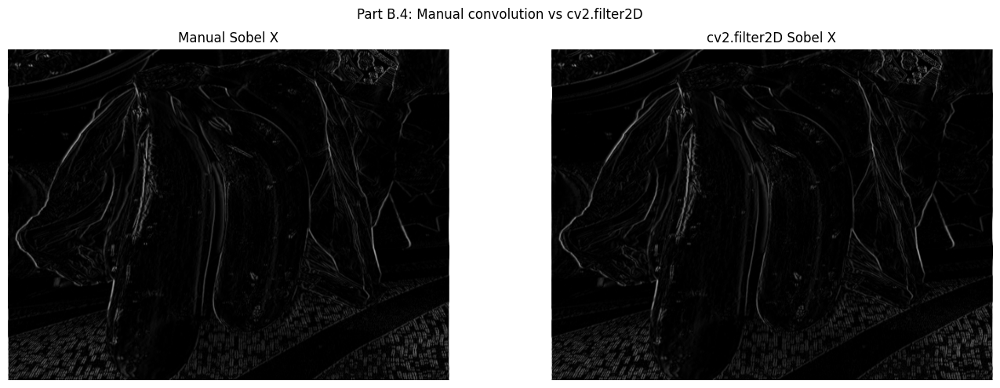

Mean absolute difference: 0.0


In [11]:
def conv2d(image, kernel):
    image = image.astype(np.float32)
    kernel = np.flipud(np.fliplr(kernel.astype(np.float32)))
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)
    for r in range(image.shape[0]):
        for c in range(image.shape[1]):
            region = padded[r:r + kh, c:c + kw]
            output[r, c] = np.sum(region * kernel)
    return output

banana_gray = cv2.imread(str(DATASET_DIR / 'banana.jpg'), cv2.IMREAD_GRAYSCALE)
banana_gray_small = cv2.resize(banana_gray, (640, 480), interpolation=cv2.INTER_AREA)
sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1],
], dtype=np.float32)

manual_sobel = conv2d(banana_gray_small, sobel_x)
opencv_sobel = cv2.filter2D(
    banana_gray_small.astype(np.float32),
    -1,
    np.flipud(np.fliplr(sobel_x)),
    borderType=cv2.BORDER_CONSTANT,
)
mad = np.mean(np.abs(manual_sobel - opencv_sobel))

show_images([
    ('Manual Sobel X', np.abs(manual_sobel), 'gray'),
    ('cv2.filter2D Sobel X', np.abs(opencv_sobel), 'gray'),
], figsize=(14, 5), suptitle='Part B.4: Manual convolution vs cv2.filter2D')
print('Mean absolute difference:', float(mad))

**Observation:** The difference should be very small. Any remaining discrepancy usually comes from border handling, floating-point precision, or implementation details such as kernel flipping and padding.

## Part C — Morphology & Mask Cleanup

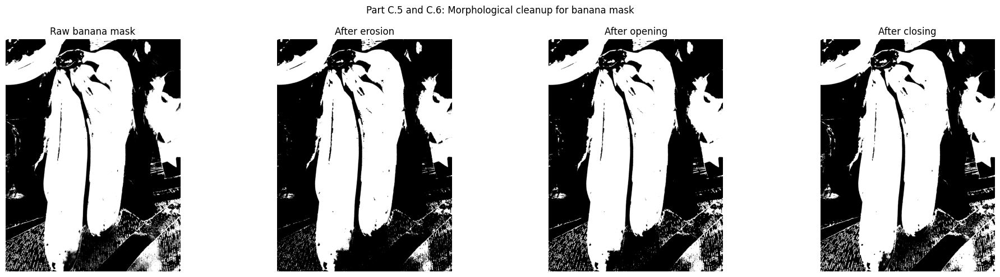

Foreground pixels:
{'raw': 5910774, 'eroded': 5368576, 'opened': 5709706, 'closed': 6081708}


In [12]:
banana_mask_raw = apply_hsv_mask(banana_bgr, (10, 50, 60), (40, 255, 255))
kernel5 = np.ones((5, 5), np.uint8)
banana_eroded = cv2.erode(banana_mask_raw, kernel5, iterations=1)
banana_opened = cv2.morphologyEx(banana_mask_raw, cv2.MORPH_OPEN, kernel5)
banana_closed = cv2.morphologyEx(banana_mask_raw, cv2.MORPH_CLOSE, kernel5)

show_images([
    ('Raw banana mask', banana_mask_raw, 'gray'),
    ('After erosion', banana_eroded, 'gray'),
    ('After opening', banana_opened, 'gray'),
    ('After closing', banana_closed, 'gray'),
], figsize=(20, 5), suptitle='Part C.5 and C.6: Morphological cleanup for banana mask')
print('Foreground pixels:')
print({
    'raw': int(np.count_nonzero(banana_mask_raw)),
    'eroded': int(np.count_nonzero(banana_eroded)),
    'opened': int(np.count_nonzero(banana_opened)),
    'closed': int(np.count_nonzero(banana_closed)),
})

**Observation:** Erosion shrinks the mask, removes thin protrusions, and can eat away small bright regions on the fruit. Opening mainly removes small noise blobs, while closing fills small holes and reconnects nearby gaps.

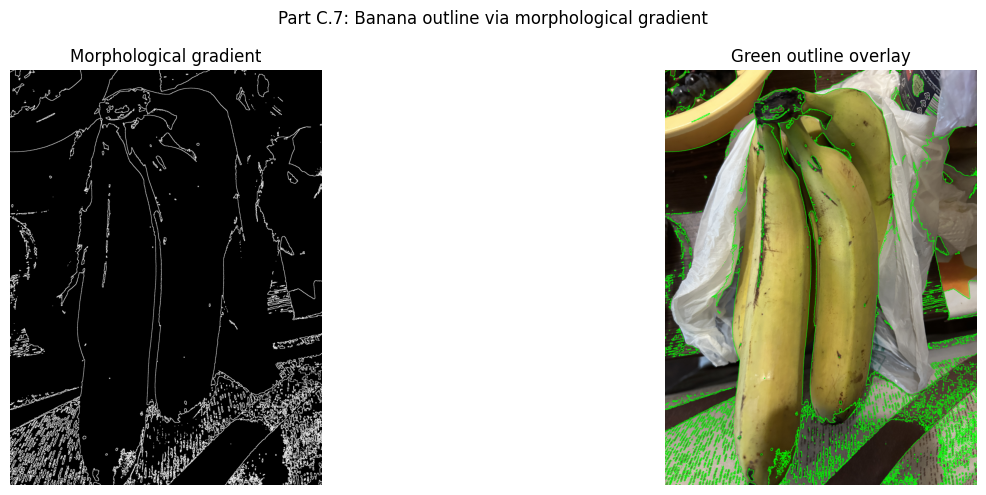

In [13]:
banana_gradient = cv2.morphologyEx(banana_closed, cv2.MORPH_GRADIENT, kernel5)
banana_overlay = banana_bgr.copy()
banana_overlay[banana_gradient > 0] = (0, 255, 0)
show_images([
    ('Morphological gradient', banana_gradient, 'gray'),
    ('Green outline overlay', bgr_to_rgb(banana_overlay), None),
], figsize=(16, 5), suptitle='Part C.7: Banana outline via morphological gradient')

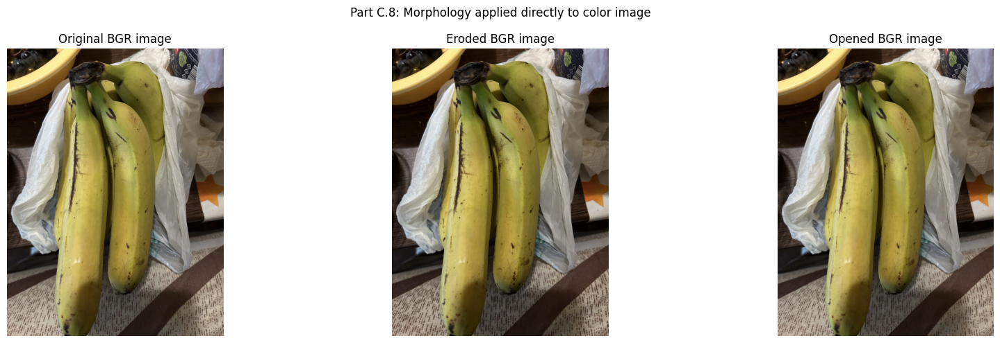

In [14]:
banana_eroded_bgr = cv2.erode(banana_bgr, kernel5, iterations=1)
banana_opened_bgr = cv2.morphologyEx(banana_bgr, cv2.MORPH_OPEN, kernel5)
show_images([
    ('Original BGR image', bgr_to_rgb(banana_bgr), None),
    ('Eroded BGR image', bgr_to_rgb(banana_eroded_bgr), None),
    ('Opened BGR image', bgr_to_rgb(banana_opened_bgr), None),
], figsize=(18, 5), suptitle='Part C.8: Morphology applied directly to color image')

**Observation:** Applying morphology directly to the BGR image changes pixel colors and textures channel-by-channel instead of cleaning a clean binary shape. The result looks smeared or distorted rather than producing a tidy object mask.

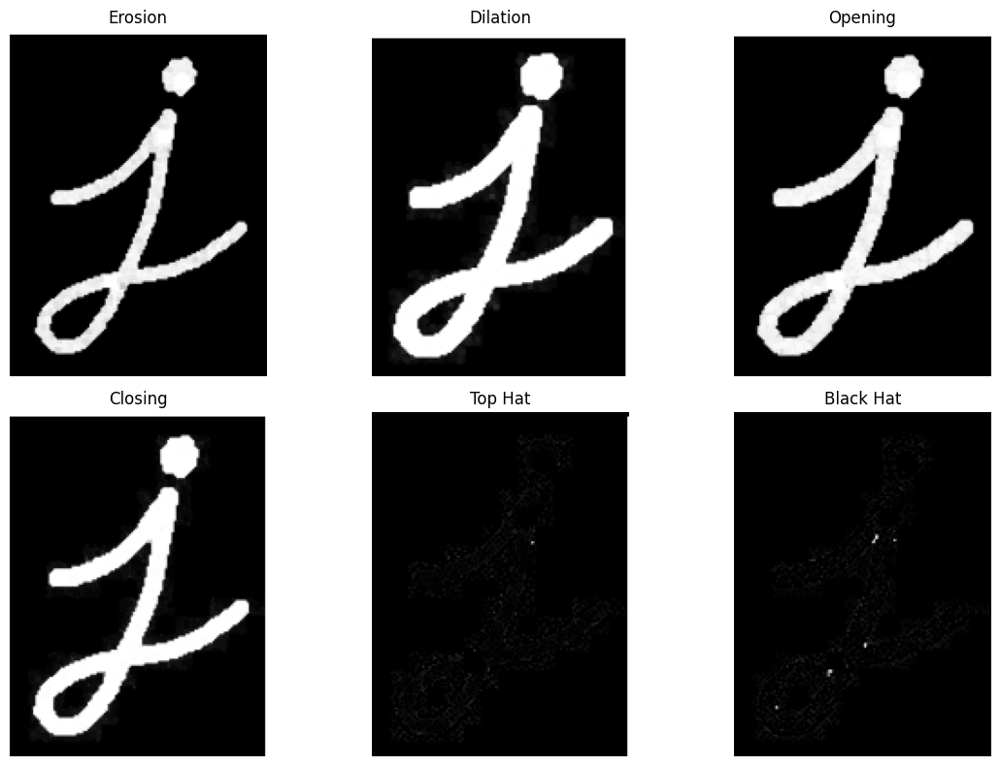

In [15]:
morph_demo = cv2.imread(str(DATASET_DIR / 'morphology.png'), cv2.IMREAD_GRAYSCALE)
kernel3 = np.ones((3, 3), np.uint8)
morph_results = {
    'Erosion': cv2.erode(morph_demo, kernel3, iterations=1),
    'Dilation': cv2.dilate(morph_demo, kernel3, iterations=1),
    'Opening': cv2.morphologyEx(morph_demo, cv2.MORPH_OPEN, kernel3),
    'Closing': cv2.morphologyEx(morph_demo, cv2.MORPH_CLOSE, kernel3),
    'Top Hat': cv2.morphologyEx(morph_demo, cv2.MORPH_TOPHAT, kernel3),
    'Black Hat': cv2.morphologyEx(morph_demo, cv2.MORPH_BLACKHAT, kernel3),
}
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for ax, (title, image) in zip(axes.ravel(), morph_results.items()):
    ax.imshow(image, cmap='gray')
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

**Observation:** Erosion is the operation that most strongly isolates thin strokes because it suppresses broader regions while leaving only the strongest narrow structures if they survive the kernel size.

## Part D — Shape & Feature Detection

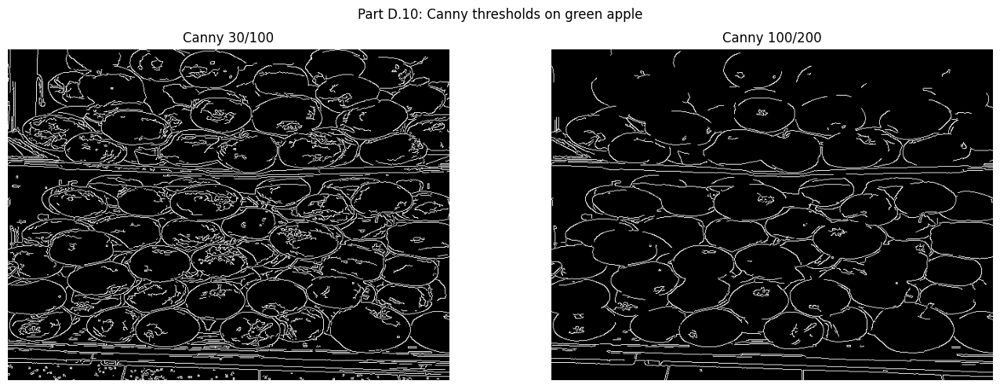

In [16]:
green_apple_gray = cv2.imread(str(DATASET_DIR / 'green_apple.jpg'), cv2.IMREAD_GRAYSCALE)
green_small = cv2.resize(green_apple_gray, (640, 480), interpolation=cv2.INTER_AREA)
canny_30_100 = cv2.Canny(green_small, 30, 100)
canny_100_200 = cv2.Canny(green_small, 100, 200)
show_images([
    ('Canny 30/100', canny_30_100, 'gray'),
    ('Canny 100/200', canny_100_200, 'gray'),
], figsize=(14, 5), suptitle='Part D.10: Canny thresholds on green apple')

**Observation:** The lower threshold pair usually captures more weak edges and interior noise, while the higher pair is stricter and often preserves the outer contour more cleanly.

**Canny pipeline:** Gaussian smoothing reduces noise, gradients estimate edge strength/direction, non-maximum suppression thins edges, double threshold separates strong/weak responses, and hysteresis keeps only weak edges connected to strong ones.

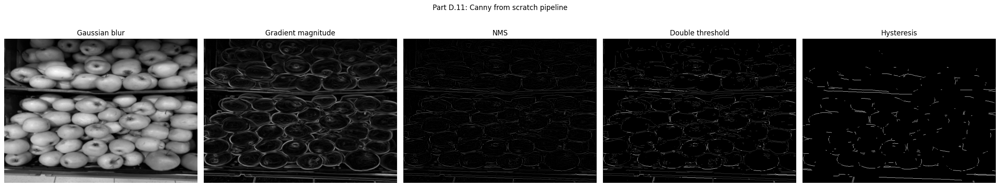

Mean absolute difference vs cv2.Canny: 30.418212890625


In [17]:
class CannyEdgeDetector:
    def __init__(self, low_threshold=30, high_threshold=100, gaussian_kernel_size=5, sigma=1.0):
        self.low_threshold = low_threshold
        self.high_threshold = high_threshold
        self.gaussian_kernel_size = gaussian_kernel_size
        self.sigma = sigma

    def gaussian_blur(self, image):
        return cv2.GaussianBlur(image, (self.gaussian_kernel_size, self.gaussian_kernel_size), self.sigma)

    def gradient(self, image):
        gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        magnitude = np.hypot(gx, gy)
        magnitude = magnitude / magnitude.max() * 255
        direction = np.arctan2(gy, gx)
        return magnitude, direction

    def non_maximum_suppression(self, magnitude, direction):
        rows, cols = magnitude.shape
        suppressed = np.zeros((rows, cols), dtype=np.float64)
        angle = np.rad2deg(direction) % 180
        for i in range(1, rows - 1):
            for j in range(1, cols - 1):
                q = 255
                r = 255
                if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
                    q = magnitude[i, j + 1]
                    r = magnitude[i, j - 1]
                elif 22.5 <= angle[i, j] < 67.5:
                    q = magnitude[i + 1, j - 1]
                    r = magnitude[i - 1, j + 1]
                elif 67.5 <= angle[i, j] < 112.5:
                    q = magnitude[i + 1, j]
                    r = magnitude[i - 1, j]
                elif 112.5 <= angle[i, j] < 157.5:
                    q = magnitude[i - 1, j - 1]
                    r = magnitude[i + 1, j + 1]
                if magnitude[i, j] >= q and magnitude[i, j] >= r:
                    suppressed[i, j] = magnitude[i, j]
        return suppressed

    def double_threshold(self, image):
        strong = 255
        weak = 75
        result = np.zeros_like(image, dtype=np.uint8)
        strong_i, strong_j = np.where(image >= self.high_threshold)
        weak_i, weak_j = np.where((image >= self.low_threshold) & (image < self.high_threshold))
        result[strong_i, strong_j] = strong
        result[weak_i, weak_j] = weak
        return result, weak, strong

    def hysteresis(self, image, weak=75, strong=255):
        rows, cols = image.shape
        result = image.copy()
        for i in range(1, rows - 1):
            for j in range(1, cols - 1):
                if result[i, j] == weak:
                    if np.any(result[i - 1:i + 2, j - 1:j + 2] == strong):
                        result[i, j] = strong
                    else:
                        result[i, j] = 0
        return result

    def detect(self, image):
        blur = self.gaussian_blur(image)
        magnitude, direction = self.gradient(blur)
        nms = self.non_maximum_suppression(magnitude, direction)
        thresholded, weak, strong = self.double_threshold(nms)
        hysteresis = self.hysteresis(thresholded, weak, strong)
        return blur, magnitude, direction, nms, thresholded, hysteresis

canny_manual = CannyEdgeDetector(low_threshold=30, high_threshold=100)
blur, magnitude, direction, nms, thresholded, hysteresis = canny_manual.detect(green_small)
show_images([
    ('Gaussian blur', blur, 'gray'),
    ('Gradient magnitude', magnitude, 'gray'),
    ('NMS', nms, 'gray'),
    ('Double threshold', thresholded, 'gray'),
    ('Hysteresis', hysteresis, 'gray'),
], figsize=(24, 5), suptitle='Part D.11: Canny from scratch pipeline')
cv_canny = cv2.Canny(green_small, 30, 100)
print('Mean absolute difference vs cv2.Canny:', float(np.mean(np.abs(hysteresis.astype(np.float32) - cv_canny.astype(np.float32)))))

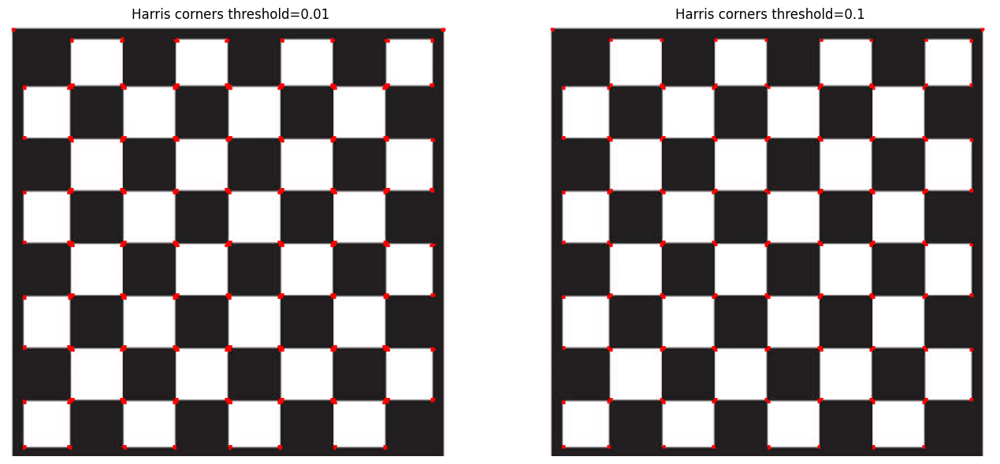

In [18]:
chess_bgr = cv2.imread(str(DATASET_DIR / 'chessboard.png'), cv2.IMREAD_COLOR)
chess_gray = cv2.cvtColor(chess_bgr, cv2.COLOR_BGR2GRAY)
harris = cv2.cornerHarris(np.float32(chess_gray), 2, 3, 0.04)
harris_dilated = cv2.dilate(harris, None)

thresholds = [0.01, 0.1]
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, thresh in zip(axes, thresholds):
    marked = bgr_to_rgb(chess_bgr.copy())
    mask = harris_dilated > thresh * harris_dilated.max()
    marked[mask] = [255, 0, 0]
    ax.imshow(marked)
    ax.set_title(f'Harris corners threshold={thresh}')
    ax.axis('off')
plt.tight_layout()
plt.show()

**Observation:** A lower Harris threshold marks many more responses, including weaker corners and some false positives. A higher threshold keeps only the strongest corner responses, so fewer points survive.

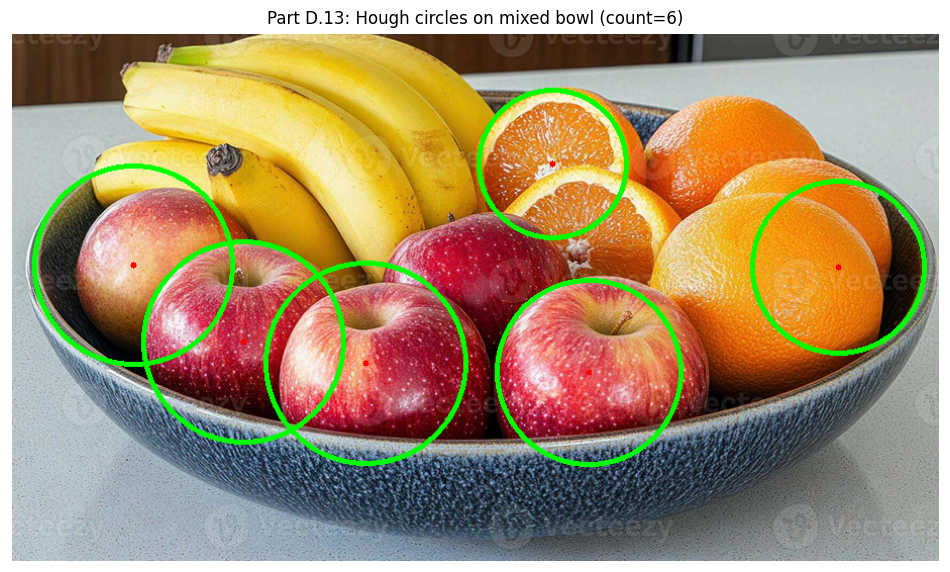

Detected round fruits: 6


In [19]:
mixed_bowl_bgr = cv2.imread(str(DATASET_DIR / 'mixed_bowl.png'), cv2.IMREAD_COLOR)
mixed_bowl_rgb = bgr_to_rgb(mixed_bowl_bgr)
mixed_bowl_gray = cv2.cvtColor(mixed_bowl_bgr, cv2.COLOR_BGR2GRAY)
mixed_bowl_blur = cv2.medianBlur(mixed_bowl_gray, 5)
circles = cv2.HoughCircles(
    mixed_bowl_blur,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=60,
    param1=120,
    param2=60,
    minRadius=30,
    maxRadius=100,
)
circle_vis = mixed_bowl_rgb.copy()
circle_count = 0
if circles is not None:
    circles = np.round(circles[0]).astype(int)
    circle_count = len(circles)
    for x, y, r in circles:
        cv2.circle(circle_vis, (x, y), r, (0, 255, 0), 3)
        cv2.circle(circle_vis, (x, y), 3, (255, 0, 0), -1)
plt.figure(figsize=(12, 7))
plt.imshow(circle_vis)
plt.title(f'Part D.13: Hough circles on mixed bowl (count={circle_count})')
plt.axis('off')
plt.show()
print('Detected round fruits:', circle_count)

**Observation:** The detected count depends strongly on `param2`. Lower values accept weaker circle evidence and increase detections, while higher values are stricter and may miss partially occluded fruit. With `param2=60`, the detector finds a cleaner set of about six round fruits, which is closer to the clearly visible circular fruit in the bowl.

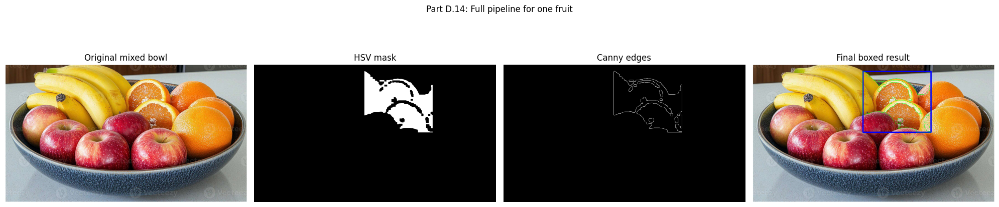

Chosen fruit: top orange slice
Saved final deliverable to: outputs\part_d_final_pipeline.png


In [20]:
fruit_choice = 'top orange slice'
mixed_hsv = cv2.cvtColor(mixed_bowl_bgr, cv2.COLOR_BGR2HSV)
# Restrict to the ROI around the top citrus slice so the mask targets one fruit.
roi = (420, 20, 260, 240)  # x, y, w, h
x, y, w, h = roi
roi_hsv = mixed_hsv[y:y + h, x:x + w]
fruit_mask_roi = cv2.inRange(roi_hsv, np.array((5, 80, 80), dtype=np.uint8), np.array((25, 255, 255), dtype=np.uint8))
fruit_mask_roi = cv2.morphologyEx(fruit_mask_roi, cv2.MORPH_OPEN, np.ones((5, 5), np.uint8))
fruit_mask_roi = cv2.morphologyEx(fruit_mask_roi, cv2.MORPH_CLOSE, np.ones((7, 7), np.uint8))
fruit_mask_roi = largest_component(fruit_mask_roi)
fruit_mask = np.zeros(mixed_bowl_gray.shape, dtype=np.uint8)
fruit_mask[y:y + h, x:x + w] = fruit_mask_roi
fruit_edges = cv2.Canny(fruit_mask, 50, 150)
ys, xs = np.where(fruit_mask > 0)
pipeline_vis = mixed_bowl_bgr.copy()
if len(xs) and len(ys):
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()
    cv2.rectangle(pipeline_vis, (x0, y0), (x1, y1), (255, 0, 0), 3)
pipeline_vis[fruit_edges > 0] = (0, 255, 0)
saved_path = safe_imwrite(OUTPUT_DIR / 'part_d_final_pipeline.png', pipeline_vis)
show_images([
    ('Original mixed bowl', mixed_bowl_rgb, None),
    ('HSV mask', fruit_mask, 'gray'),
    ('Canny edges', fruit_edges, 'gray'),
    ('Final boxed result', bgr_to_rgb(pipeline_vis), None),
], figsize=(20, 5), suptitle='Part D.14: Full pipeline for one fruit')
print('Chosen fruit:', fruit_choice)
print('Saved final deliverable to:', saved_path)